# 07 — 3D Close Encounter and KS Diagnostics

This notebook exercises the 3D code paths. Two particles are set up for a near-miss encounter in the $z = \pm 0.05$ planes, so the relative coordinate sweeps through all three spatial dimensions near periapsis.

**Backend expectations** (see [`theory/RegularizedIntegrationDesign.md`](../../../theory/RegularizedIntegrationDesign.md)):

- `:lifted_pair` is **2D-only** — requesting it in 3D triggers an automatic fallback to `:adaptive_cartesian`, with a warning (when `warn_on_fallback = true`) and a bump in `backend_fallback_steps`.
- 3D `:adaptive_cartesian` additionally applies the KS bilinear projection as a diagnostic; the worst residual is tracked in `max_constraint_violation`.

In [1]:
include(joinpath(@__DIR__, "common.jl"))

## 1. 3D initial conditions

In [2]:
system3 = HamiltonianSystem(2, 3)

# Near-miss in xy-plane with small z offset; anti-parallel transverse momenta
q0 = [-2.0, 0.0,  0.05,
       2.0, 0.0, -0.05]
p0 = [ 0.0,  0.12, 0.0,
       0.0, -0.12, 0.0]

tspan = (0.0, 60.0)

masses  = [1.0, 1.0]
charges = [1.0, -1.0]   # attractive — drives the close pass
c       = C_CANON
dt      = 0.001

println("System: ", system3.n_particles, " particles, ", system3.dims, "D")

System: 2 particles, 3D
 particles, 3D


## 2. Three runs

In [3]:
prob_none = HamiltonianProblem(system3, tspan, q0, p0;
    masses = masses, charges = charges, c = c, dt = dt,
)
sol_none = solve(prob_none)
print_reg_diagnostics(sol_none; label = "3D/none")

[3D/none] retcode                  = Success
[3D/none] requested_backend        = disabled
[3D/none] used_backend             = disabled
[3D/none] active_steps             = 0
[3D/none] pair_steps               = 0
[3D/none] adaptive_pair_steps      = 0
[3D/none] lifted_pair_steps        = 0
[3D/none] chain_steps              = 0
[3D/none] unregularized_steps      = 60000
[3D/none] backend_fallback_steps   = 0
[3D/none] total_substeps           = 60000
[3D/none] max_substeps_used        = 1
[3D/none] activation_count         = 0
[3D/none] deactivation_count       = 0
[3D/none] min_encounter_distance   = Inf
[3D/none] max_constraint_violation = 0.000e+00


In [4]:
# Request lifted_pair in 3D: expect automatic fallback to :adaptive_cartesian
prob_fallback = HamiltonianProblem(system3, tspan, q0, p0;
    masses = masses, charges = charges, c = c, dt = dt,
    regularization = RegularizationOptions(
        enabled = true, backend = :lifted_pair,
        r_on = 0.4, r_off = 0.6, warn_on_fallback = true,
    ),
)
sol_fallback = solve(prob_fallback)
print_reg_diagnostics(sol_fallback; label = "3D/req=lifted")
@assert sol_fallback.regularization.used_backend == :adaptive_cartesian

[3D/req=lifted] retcode                  = Success
[3D/req=lifted] requested_backend        = lifted_pair


┌ Warning: RegularizationOptions(backend=:lifted_pair) is currently supported only for 2D; falling back to :adaptive_cartesian for 3D
└ @ WeberElectrodynamics /Users/mac/dev/Weber/WeberElectrodynamics/src/solve.jl:1066


[3D/req=lifted] used_backend             = adaptive_cartesian
[3D/req=lifted] active_steps             = 1233
[3D/req=lifted] pair_steps               = 1233
[3D/req=lifted] adaptive_pair_steps      = 1233
[3D/req=lifted] lifted_pair_steps        = 0
[3D/req=lifted] chain_steps              = 0
[3D/req=lifted] unregularized_steps      = 58767
[3D/req=lifted] backend_fallback_steps   = 1233
[3D/req=lifted] total_substeps           = 60841
[3D/req=lifted] max_substeps_used        = 2
[3D/req=lifted] activation_count         = 4
[3D/req=lifted] deactivation_count       = 4
[3D/req=lifted] min_encounter_distance   = 0.24464
[3D/req=lifted] max_constraint_violation = 0.000e+00


In [5]:
# Explicit :adaptive_cartesian
prob_adapt = HamiltonianProblem(system3, tspan, q0, p0;
    masses = masses, charges = charges, c = c, dt = dt,
    regularization = RegularizationOptions(
        enabled = true, backend = :adaptive_cartesian,
        r_on = 0.4, r_off = 0.6,
    ),
)
sol_adapt = solve(prob_adapt)
print_reg_diagnostics(sol_adapt; label = "3D/adaptive")

[3D/adaptive] retcode                  = Success
[3D/adaptive] requested_backend        = adaptive_cartesian
[3D/adaptive] used_backend             = adaptive_cartesian
[3D/adaptive] active_steps             = 1233
[3D/adaptive] pair_steps               = 1233
[3D/adaptive] adaptive_pair_steps      = 1233
[3D/adaptive] lifted_pair_steps        = 0
[3D/adaptive] chain_steps              = 0
[3D/adaptive] unregularized_steps      = 58767
[3D/adaptive] backend_fallback_steps   = 0
[3D/adaptive] total_substeps           = 60841
[3D/adaptive] max_substeps_used        = 2
[3D/adaptive] activation_count         = 4
[3D/adaptive] deactivation_count       = 4
[3D/adaptive] min_encounter_distance   = 0.24464
[3D/adaptive] max_constraint_violation = 0.000e+00
[3D/adaptive] used_backend             = adaptive_cartesian
[3D/adaptive] active_steps             = 1233
[3D/adaptive] pair_steps               = 1233
[3D/adaptive] adaptive_pair_steps      = 1233
[3D/adaptive] lifted_pair_steps        = 0


## 3. 3D trajectories (exercises the 3D branch of `plot_trajectories`)

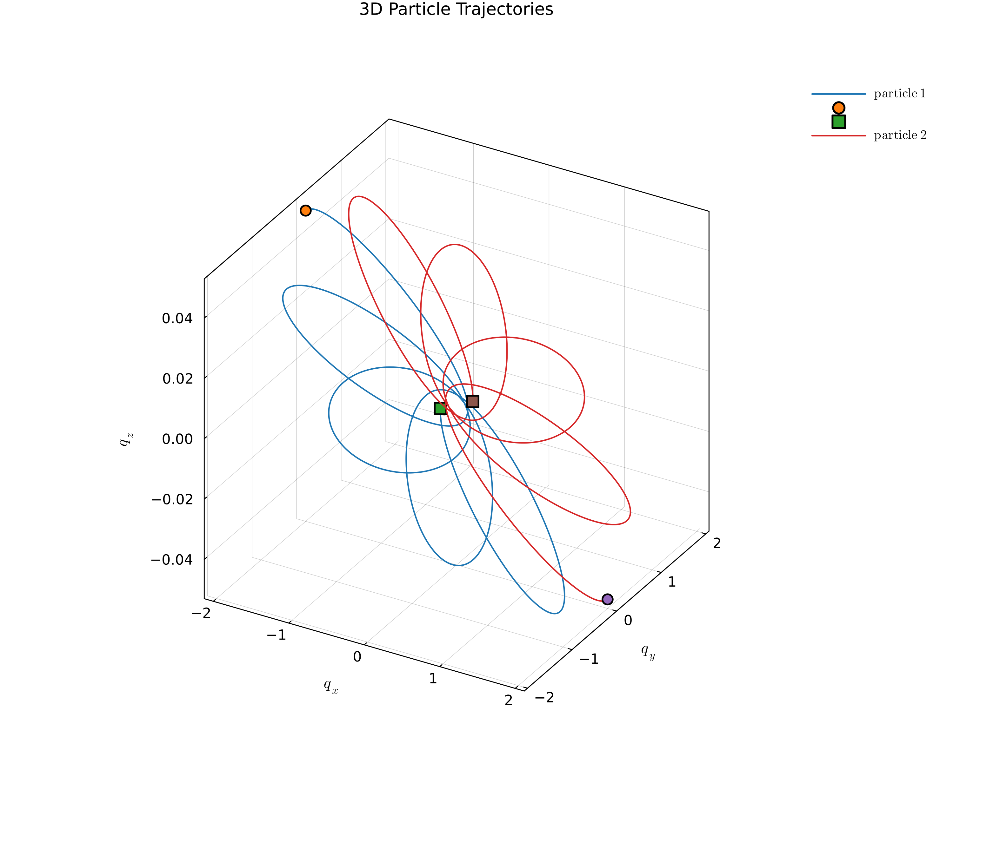

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [6]:
plot_trajectories(compute_trajectory_data(sol_none,     2, 3; stride = 10))

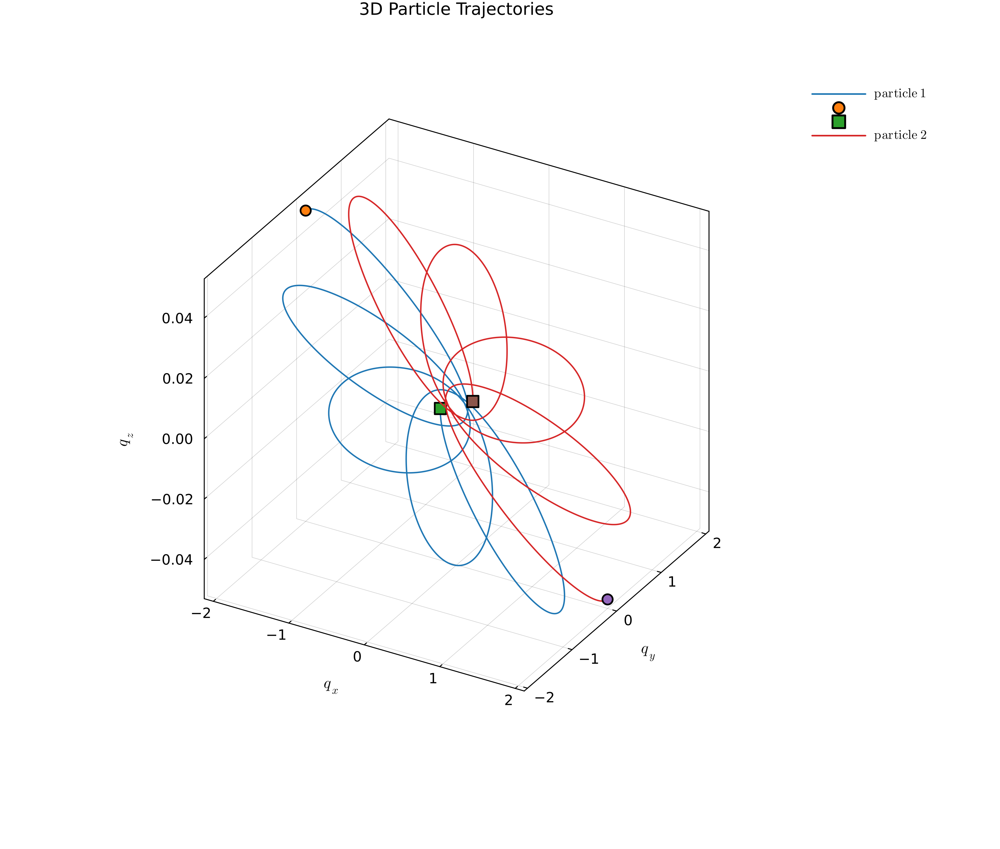

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [7]:
plot_trajectories(compute_trajectory_data(sol_fallback, 2, 3; stride = 10))

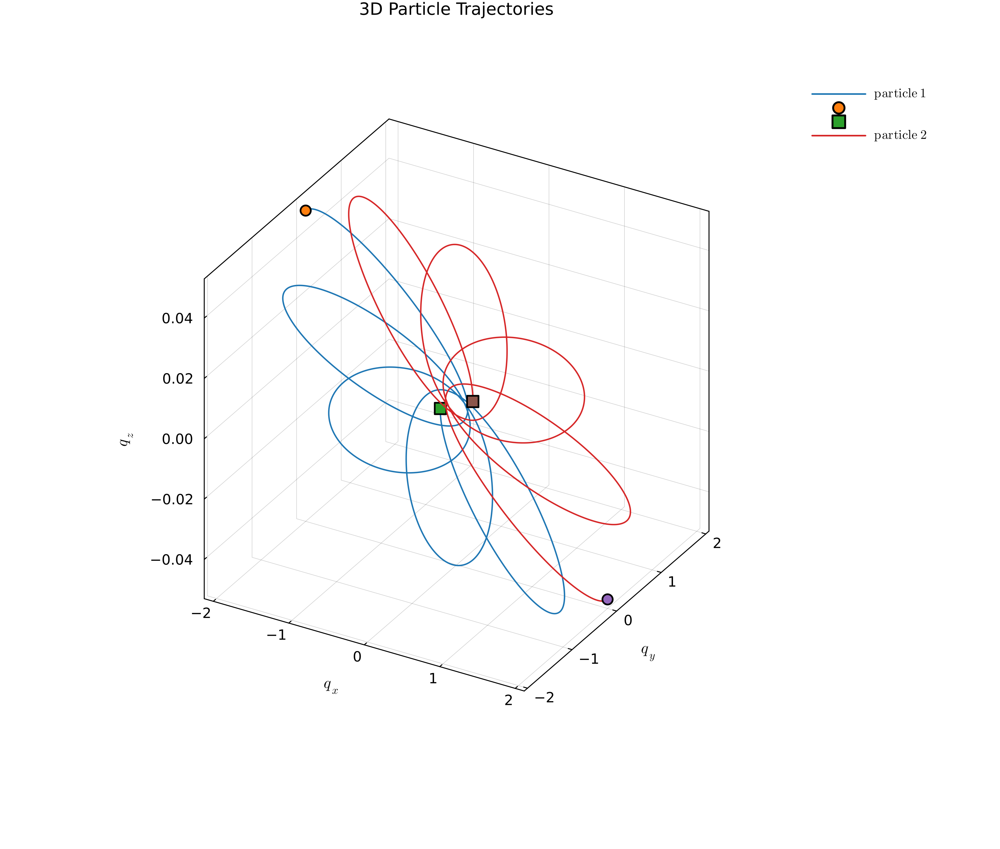

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [8]:
plot_trajectories(compute_trajectory_data(sol_adapt,    2, 3; stride = 10))

## 4. Energy errors

Energy drift (unregularized 3D): 1.594e-02 %
Energy drift (adaptive 3D):     3.742e-03 %


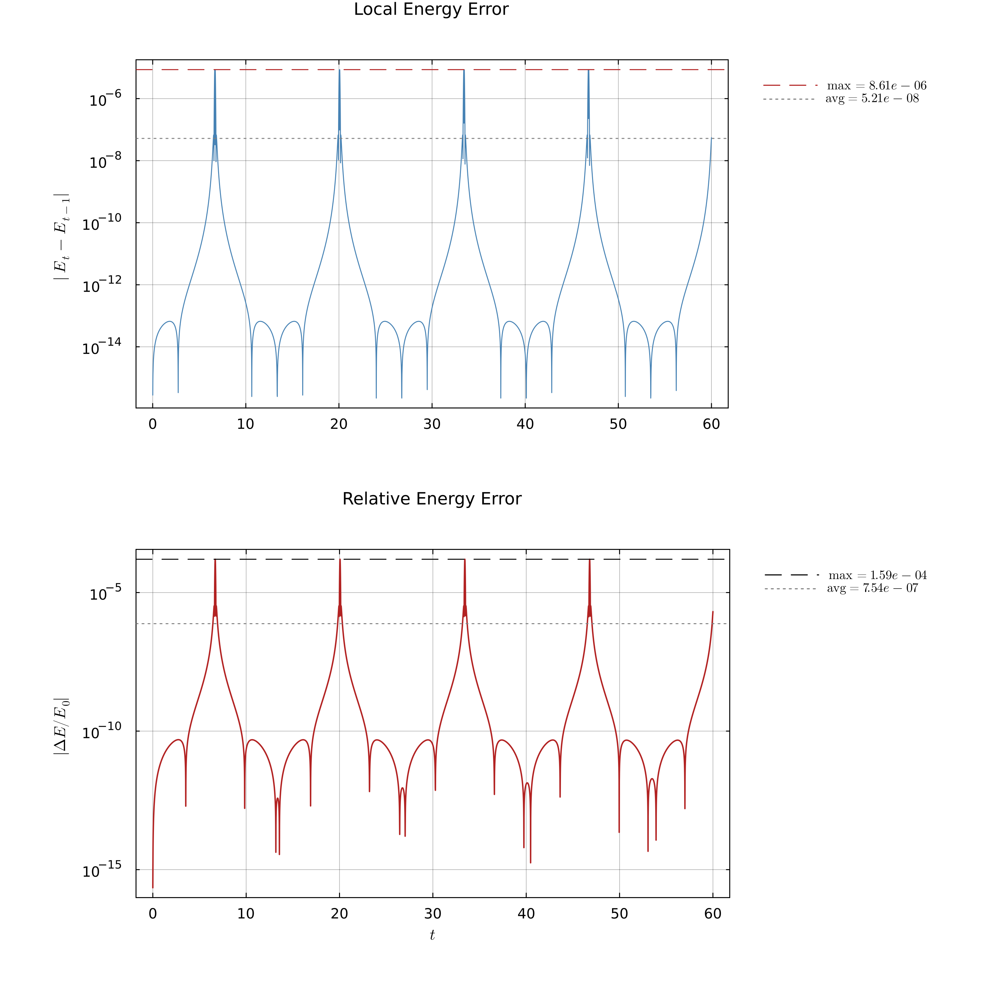

In [9]:
en_none = compute_energy_timeseries(sol_none;     stride = 10)
en_adap = compute_energy_timeseries(sol_adapt;    stride = 10)

@printf("Energy drift (unregularized 3D): %.3e %%\n", en_none.statistics.global_error_percent_max)
@printf("Energy drift (adaptive 3D):     %.3e %%\n", en_adap.statistics.global_error_percent_max)

plot_energy_errors(en_none)

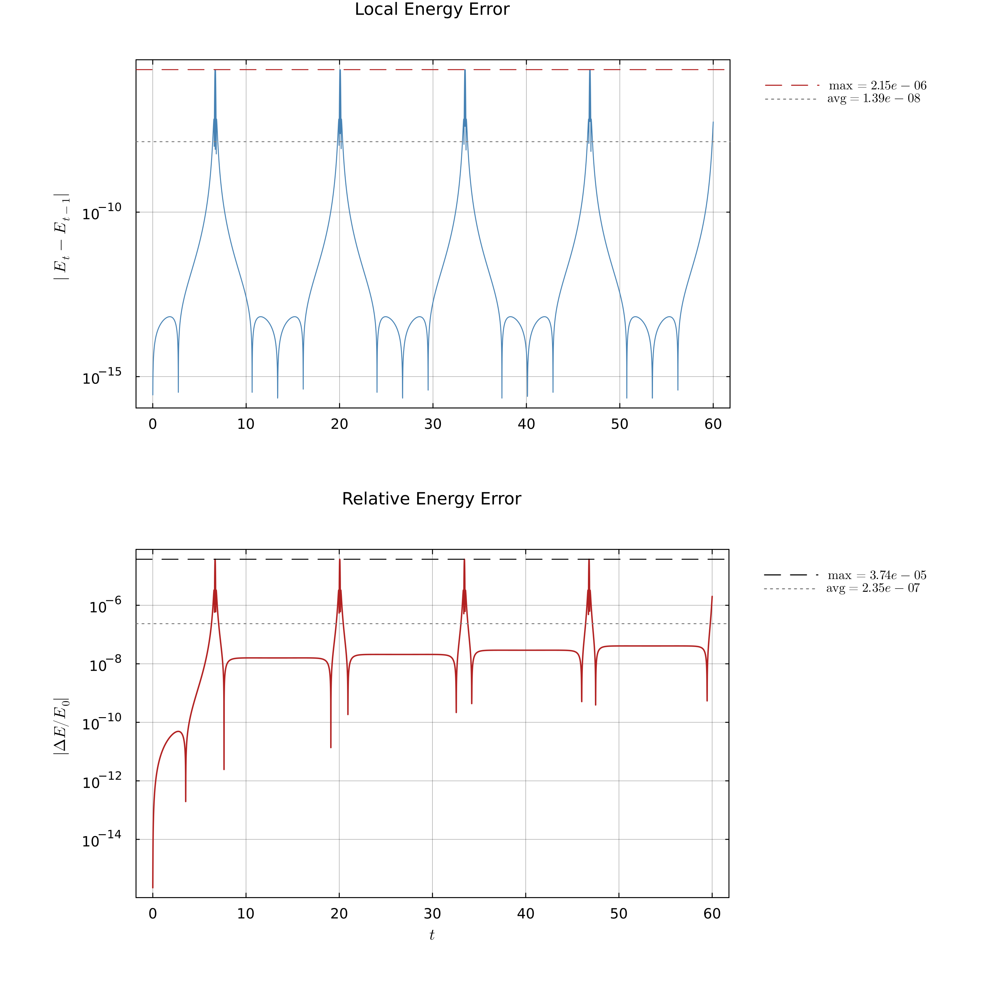

In [10]:
plot_energy_errors(en_adap)

## 5. 3D force and phase-space analysis

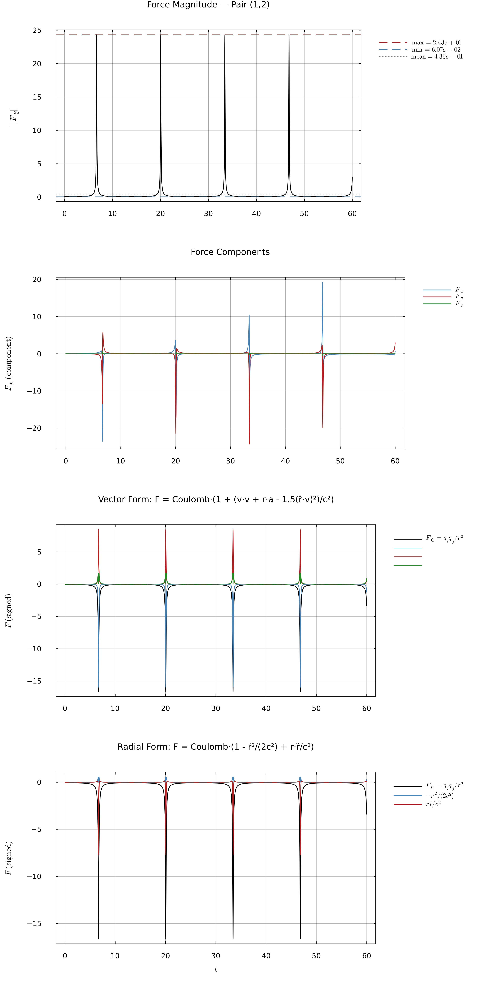

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [11]:
forces = compute_pair_force_timeseries(sol_adapt, (1, 2), 2, 3, masses, charges, c; stride = 10)
plot_pair_forces(forces)

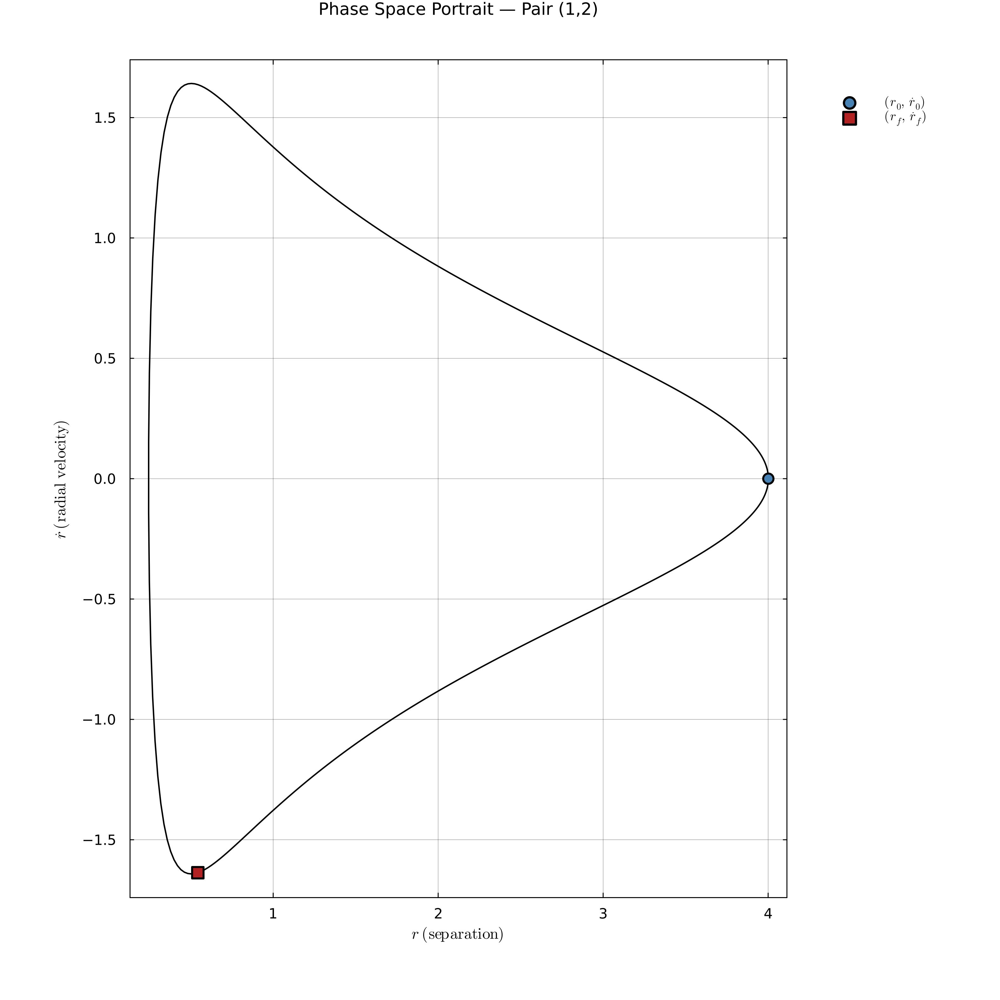

In [12]:
plot_phase_space(forces)

## 6. Full-vector momentum drift (3D branch of `plot_momentum_errors`)

In 3D the angular momentum is a full vector $\mathbf{L}(t)$, not a scalar $L_z$. The plot's second panel reports $\|\mathbf{L}(t) - \mathbf{L}(0)\|$.

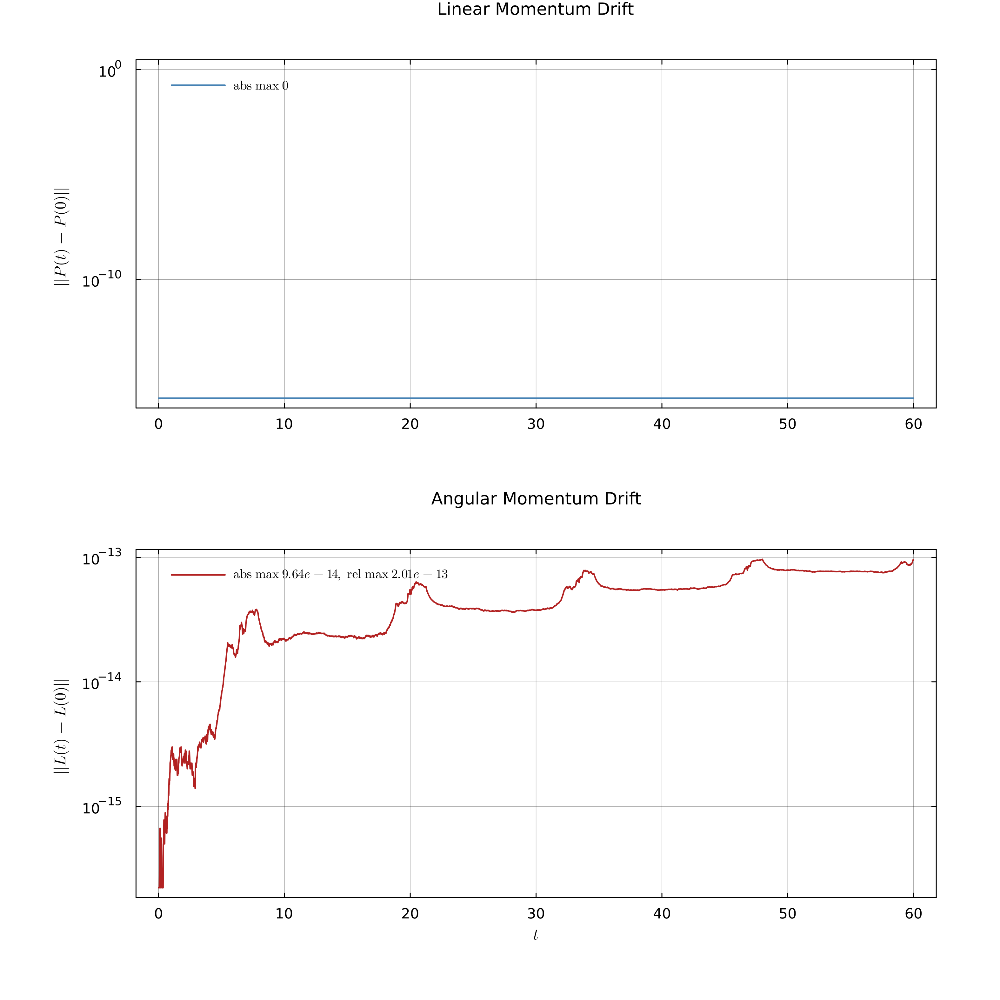

In [13]:
plot_momentum_errors(compute_momentum_timeseries(sol_adapt; stride = 10))

## 7. KS constraint diagnostics

In 3D `:adaptive_cartesian` applies the KS bilinear projection $\Psi(u, U) = u_4 U_1 - u_3 U_2 + u_2 U_3 - u_1 U_4 = 0$ as a diagnostic. The largest observed residual is tracked in `max_constraint_violation` — this is our measure of how well the 4D lift is staying on the physical manifold.

In [14]:
println("max_constraint_violation (adaptive):   ", sol_adapt.regularization.max_constraint_violation)
println("max_constraint_violation (fallback):   ", sol_fallback.regularization.max_constraint_violation)
println("min_encounter_distance (adaptive):     ", round(sol_adapt.regularization.min_encounter_distance, sigdigits = 6))

max_constraint_violation (adaptive):   0.0
max_constraint_violation (fallback):   0.0
min_encounter_distance (adaptive):     0.24464
